In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
# read the dataset and display table information
df_24 = pd.read_csv('../data/clean/cleaned_df_24.csv')

In [4]:
display(df_24, df_24.info(), df_24.nunique())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33623 entries, 0 to 33622
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   country           33623 non-null  object 
 1   age_range         33623 non-null  object 
 2   employment        33623 non-null  object 
 3   work_location     33623 non-null  object 
 4   education_level   33623 non-null  object 
 5   years_coding      33623 non-null  float64
 6   years_coding_pro  33623 non-null  float64
 7   type              33623 non-null  object 
 8   currency          33623 non-null  object 
 9   salary            33623 non-null  float64
dtypes: float64(3), object(7)
memory usage: 2.6+ MB


,country,age_range,employment,work_location,education_level,years_coding,years_coding_pro,type,currency,salary
0,Other,18-24 years old,"Employed, full-time",Hybrid,High School or Less,3.0,1.0,Data Scientist,PKR,2040000.0
1,Austria,25-34 years old,"Employed, full-time",Hybrid,Professional/Doctoral,12.0,6.0,Specialist,EUR,28000.0
2,Other,35-44 years old,"Employed, full-time",Remote,Master Degree,15.0,6.0,Data Scientist,EUR,85000.0
3,France,35-44 years old,Freelancer/Contractor,Remote,Master Degree,27.0,17.0,Back-End Developer,EUR,50000.0
4,United States of America,25-34 years old,"Employed, full-time",Remote,Some College,7.0,7.0,Student,USD,110000.0
...,...,...,...,...,...,...,...,...,...,...
33618,Other,18-24 years old,"Employed, full-time",Hybrid,High School or Less,3.0,3.0,Full Stack Developer,EUR,36000.0
33619,France,25-34 years old,"Employed, full-time",Hybrid,Bachelor Degree,10.0,7.0,Full Stack Developer,EUR,40000.0
33620,France,25-34 years old,"Employed, full-time",Hybrid,Master Degree,13.0,9.0,Full Stack Developer,EUR,61000.0
33621,Italy,35-44 years old,"Employed, full-time",Remote,Bachelor Degree,20.0,18.0,Back-End Developer,EUR,58000.0


None

country               18
age_range              6
employment             4
work_location          3
education_level        6
years_coding          50
years_coding_pro      50
type                  17
currency              32
salary              3325
dtype: int64

In [6]:
#standardise currency to EUR

In [9]:
print(df_24['currency'].value_counts())

currency
EUR      9522
USD      8720
GBP      2016
Other    1823
INR      1520
CAD      1260
UAH       907
BRL       866
PLN       799
AUD       760
SEK       664
CHF       565
CZK       388
RUB       377
DKK       334
NOK       327
ILS       290
NZD       262
ZAR       219
MXN       216
TRY       206
HUF       200
RON       174
PKR       155
BGN       151
IRR       151
JPY       146
BDT       145
TWD       126
IDR       125
COP       108
CNY       101
Name: count, dtype: int64


In [15]:
# Exchange rates to EUR
exchange_rates = {
    'EUR': 1.00,
    'USD': 0.92,
    'GBP': 1.16,
    'INR': 0.011,
    'CAD': 0.67,
    'UAH': 0.025,
    'BRL': 0.18,
    'PLN': 0.21,
    'AUD': 0.59,
    'SEK': 0.086,
    'CHF': 1.04,
    'CZK': 0.041,
    'RUB': 0.0095,
    'DKK': 0.13,
    'NOK': 0.087,
    'ILS': 0.24,
    'NZD': 0.55,
    'ZAR': 0.049,
    'MXN': 0.052,
    'TRY': 0.034,
    'HUF': 0.0026,
    'RON': 0.20,
    'PKR': 0.0032,
    'BGN': 0.51,
    'IRR': 0.000022,
    'JPY': 0.0063,
    'BDT': 0.0086,
    'TWD': 0.029,
    'IDR': 0.000061,
    'COP': 0.00022,
    'CNY': 0.13
}

other_exchange_rates = {
    'NGN': 0.0012,
    'SGD': 0.64,
    'KRW': 0.0007,
    'VND': 0.000039,
    'ARS': 0.0026,
    'CLP': 0.0011,
    'HKD': 0.12,
    'AED': 0.25,
    'LKR': 0.0028,
    'PHP': 0.017,
    'RSD': 0.0085,
    'MYR': 0.21,
    'EGP': 0.029,
    'THB': 0.026,
    'KES': 0.0065,
    'NPR': 0.0071,
    'GEL': 0.35,
    'MAD': 0.090,
    'KZT': 0.002,
    'PEN': 0.23,
    'TND': 0.30,
    'UYU': 0.022,
    'AMD': 0.0018,
    'BAM': 0.51,
    'SAR': 0.25,
    'DOP': 0.016,
    'GHS': 0.079,
    'XOF': 0.0015,
    'PYG': 0.00014,
    'ETB': 0.017,
    'BOB': 0.13,
    'GTQ': 0.12,
    'UZS': 0.000079,
    'BYN': 0.37,
    'JOD': 1.29,
    'ISK': 0.0071,
    'AFN': 0.011,
    'CRC': 0.0017,
    'AZN': 0.53,
    'DZD': 0.0068,
    'MKD': 0.016,
    'MDL': 0.052,
    'IQD': 0.00063,
    'TZS': 0.00037,
    'UGX': 0.00024,
    'KGS': 0.010,
    'ALL': 0.0093,
    'MVR': 0.058,
    'MUR': 0.020,
    'RWF': 0.00080,
    'XAF': 0.0015,
    'HNL': 0.038,
    'FJD': 0.42,
    'SYP': 0.00040,
    'MGA': 0.00020,
    'TMT': 0.27,
    'ZMW': 0.048,
    'MMK': 0.00044,
    'BHD': 2.44,
    'JMD': 0.0060,
    'QAR': 0.25,
    'AOA': 0.0011,
    'TTD': 0.14,
    'MNT': 0.00027,
    'MWK': 0.00080,
    'MZN': 0.014,
    'NIO': 0.025,
    'KWD': 3.04,
    'XPF': 0.0084,
    'OMR': 2.40,
    'YER': 0.0037,
    'VES': 0.000025,
    'GGP': 1.16,
    'ANG': 0.51,
    'NAD': 0.049,
    'BTN': 0.011,
    'MOP': 0.11,
    'BIF': 0.00035,
    'KHR': 0.00022,
    'CUP': 0.036,
    'TJS': 0.083,
    'MRU': 0.024,
    'CVE': 0.0091,
    'SRD': 0.025,
    'SZL': 0.049,
    'BWP': 0.069,
    'FKP': 1.16,
    'BND': 0.64,
    'WST': 0.34,
    'IMP': 1.16,
    'XDR': 1.29,
    'SOS': 0.0016,
    'LBP': 0.00006,
    'BSD': 0.92,
    'LYD': 0.19,
    'SLL': 0.000043,
    'GYD': 0.0044,
    'KPW': 0.00092,
    'AWG': 0.51
}
other_median_rate = pd.Series(list(other_exchange_rates.values())).median()

# Apply the conversion to EUR for each row
df_24['salary_eur'] = df_24.apply(lambda row: row['salary'] * exchange_rates.get(row['currency'], other_median_rate if row['currency'] == 'Other' else exchange_rates.get(row['currency'], 1)), axis=1)

# Verify the new column
df_24[['currency', 'salary', 'salary_eur']].tail(30)

,currency,salary,salary_eur
33593,BRL,36000.0,6480.0
33594,BRL,160000.0,28800.0
33595,Other,20000000.0,400000.0
33596,USD,185000.0,170200.0
33597,USD,250000.0,230000.0
33598,USD,235000.0,216200.0
33599,USD,40000.0,36800.0
33600,USD,130000.0,119600.0
33601,USD,250000.0,230000.0
33602,USD,157000.0,144440.0


In [16]:
display(df_24)

,country,age_range,employment,work_location,education_level,years_coding,years_coding_pro,type,currency,salary,salary_eur
0,Other,18-24 years old,"Employed, full-time",Hybrid,High School or Less,3.0,1.0,Data Scientist,PKR,2040000.0,6528.0
1,Austria,25-34 years old,"Employed, full-time",Hybrid,Professional/Doctoral,12.0,6.0,Specialist,EUR,28000.0,28000.0
2,Other,35-44 years old,"Employed, full-time",Remote,Master Degree,15.0,6.0,Data Scientist,EUR,85000.0,85000.0
3,France,35-44 years old,Freelancer/Contractor,Remote,Master Degree,27.0,17.0,Back-End Developer,EUR,50000.0,50000.0
4,United States of America,25-34 years old,"Employed, full-time",Remote,Some College,7.0,7.0,Student,USD,110000.0,101200.0
...,...,...,...,...,...,...,...,...,...,...,...
33618,Other,18-24 years old,"Employed, full-time",Hybrid,High School or Less,3.0,3.0,Full Stack Developer,EUR,36000.0,36000.0
33619,France,25-34 years old,"Employed, full-time",Hybrid,Bachelor Degree,10.0,7.0,Full Stack Developer,EUR,40000.0,40000.0
33620,France,25-34 years old,"Employed, full-time",Hybrid,Master Degree,13.0,9.0,Full Stack Developer,EUR,61000.0,61000.0
33621,Italy,35-44 years old,"Employed, full-time",Remote,Bachelor Degree,20.0,18.0,Back-End Developer,EUR,58000.0,58000.0


In [26]:
print(df_24['country'].value_counts())

country
Other                                                   8705
United States of America                                7025
Germany                                                 2998
United Kingdom of Great Britain and Northern Ireland    2001
Ukraine                                                 1606
India                                                   1548
France                                                  1330
Canada                                                  1275
Brazil                                                   930
Poland                                                   886
Netherlands                                              868
Spain                                                    787
Italy                                                    771
Australia                                                749
Sweden                                                   688
Switzerland                                              554
Austria         

In [28]:
# Rename specific country values for simplificity
df_24['country'] = df_24['country'].replace({
    'United States of America': 'United States',
    'United Kingdom of Great Britain and Northern Ireland': 'United Kingdom'
})
print(df_24['country'].value_counts())

country
Other             8705
United States     7025
Germany           2998
United Kingdom    2001
Ukraine           1606
India             1548
France            1330
Canada            1275
Brazil             930
Poland             886
Netherlands        868
Spain              787
Italy              771
Australia          749
Sweden             688
Switzerland        554
Austria            494
Czech Republic     408
Name: count, dtype: int64


# viewing

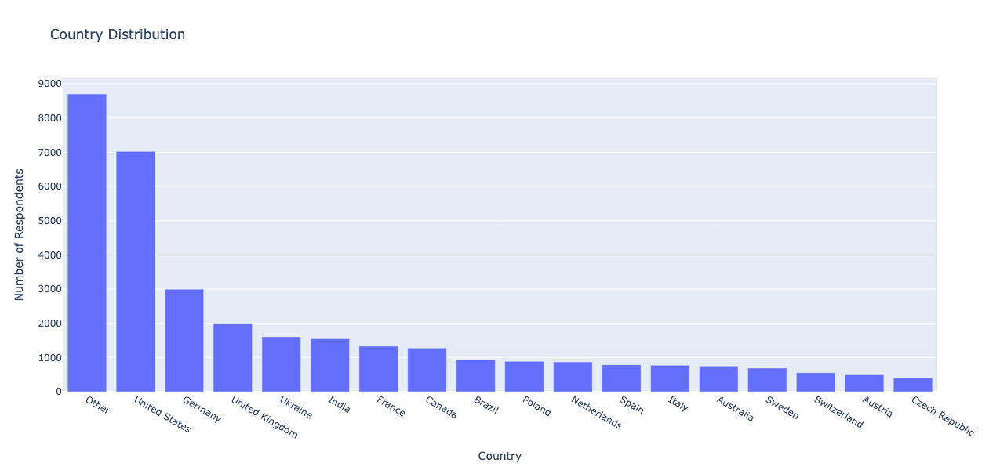

In [29]:
# Get the value counts for the 'country' column
country_distribution = df_24['country'].value_counts().reset_index()
country_distribution.columns = ['country', 'count']

# Create a bar chart for country distribution
fig = px.bar(country_distribution, x='country', y='count', 
             title='Country Distribution',
             labels={'count': 'Number of Respondents', 'country': 'Country'},
             width=1000, height=600)

# Update layout for better visualization
fig.update_layout(xaxis={'categoryorder':'total descending'}, xaxis_title='Country', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

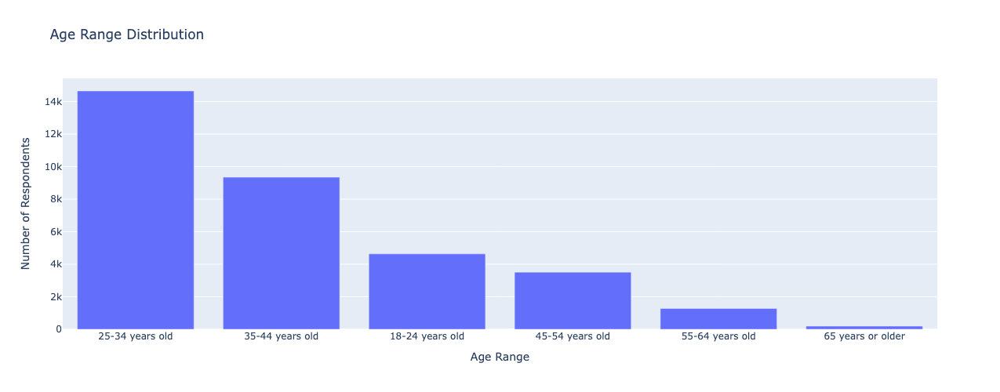

In [30]:
# Get the value counts for the 'age_range' column
age_range_distribution = df_24['age_range'].value_counts().reset_index()
age_range_distribution.columns = ['age_range', 'count']

# Create a bar chart for age range distribution
fig = px.bar(age_range_distribution, x='age_range', y='count', 
             title='Age Range Distribution',
             labels={'count': 'Number of Respondents', 'age_range': 'Age Range'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Age Range', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

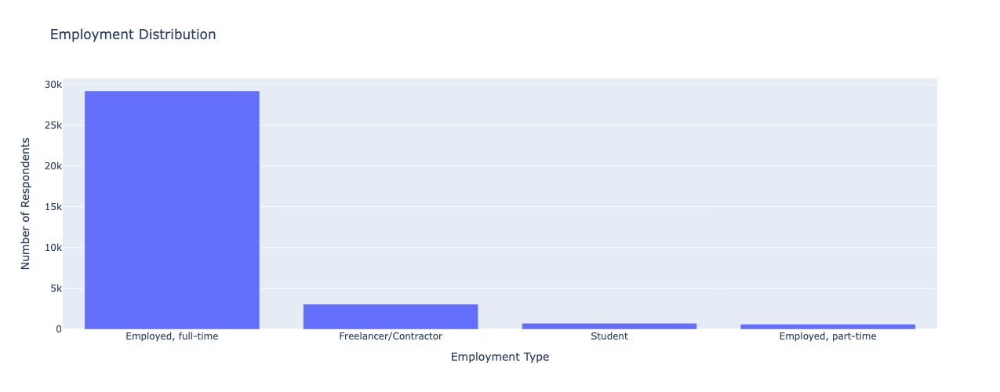

In [31]:
# Get the value counts for the 'employment' column
employment_distribution = df_24['employment'].value_counts().reset_index()
employment_distribution.columns = ['employment', 'count']

# Create a bar chart for employment distribution
fig = px.bar(employment_distribution, x='employment', y='count', 
             title='Employment Distribution',
             labels={'count': 'Number of Respondents', 'employment': 'Employment Type'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Employment Type', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

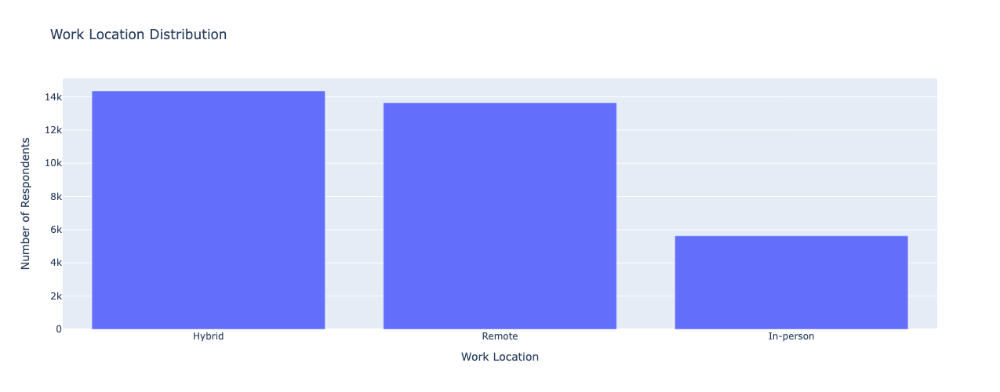

In [32]:
# Get the value counts for the 'work_location' column
work_location_distribution = df_24['work_location'].value_counts().reset_index()
work_location_distribution.columns = ['work_location', 'count']

# Create a bar chart for work location distribution
fig = px.bar(work_location_distribution, x='work_location', y='count', 
             title='Work Location Distribution',
             labels={'count': 'Number of Respondents', 'work_location': 'Work Location'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Work Location', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

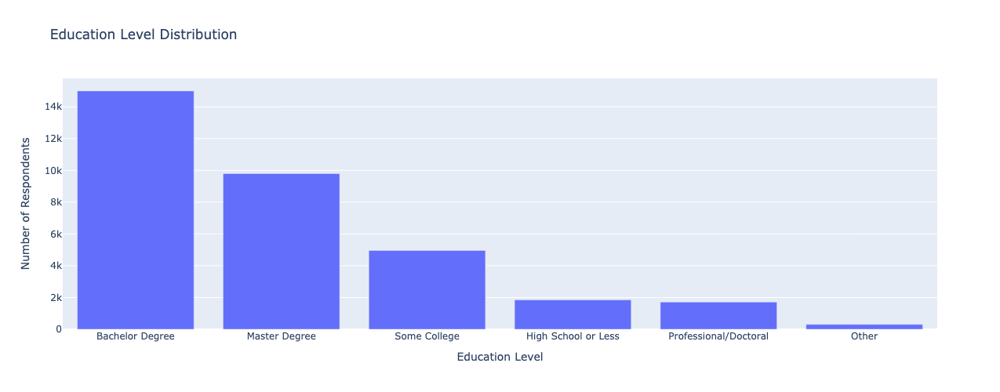

In [33]:
# Get the value counts for the 'education_level' column
education_level_distribution = df_24['education_level'].value_counts().reset_index()
education_level_distribution.columns = ['education_level', 'count']

# Create a bar chart for education level distribution
fig = px.bar(education_level_distribution, x='education_level', y='count', 
             title='Education Level Distribution',
             labels={'count': 'Number of Respondents', 'education_level': 'Education Level'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Education Level', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

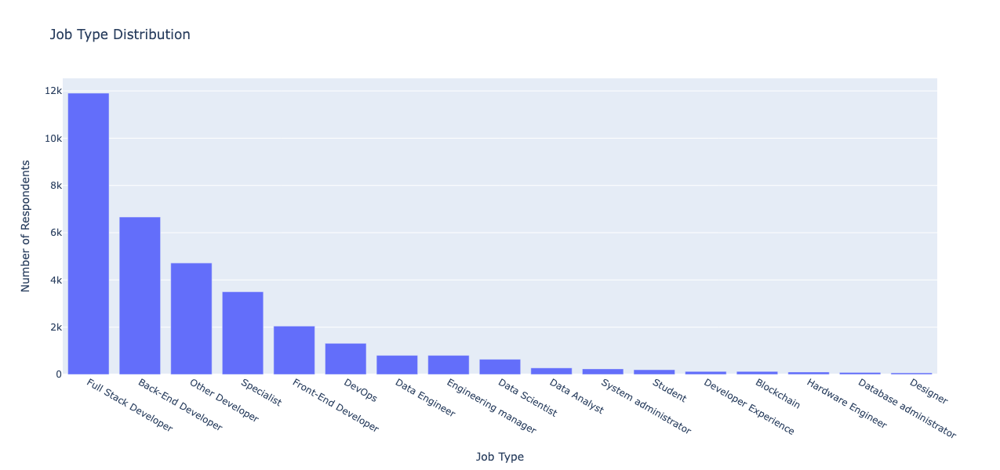

In [34]:
# Get the value counts for the 'type' column
type_distribution = df_24['type'].value_counts().reset_index()
type_distribution.columns = ['type', 'count']

# Create a bar chart for type distribution
fig = px.bar(type_distribution, x='type', y='count', 
             title='Job Type Distribution',
             labels={'count': 'Number of Respondents', 'type': 'Job Type'},
             width=1000, height=600)

# Update layout for better visualization
fig.update_layout(xaxis_title='Job Type', yaxis_title='Number of Respondents', 
                  xaxis={'categoryorder':'total descending'})

# Display the plot
fig.show()

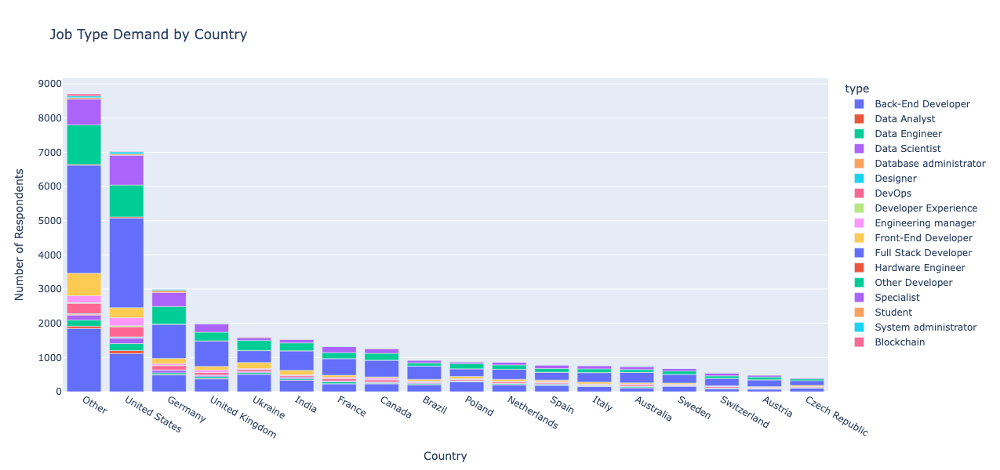

In [39]:
# Count of job types by country
job_type_country = df_24.groupby(['country', 'type']).size().reset_index(name='count')

fig = px.bar(job_type_country, x='country', y='count', color='type', 
             title='Job Type Demand by Country',
             labels={'count': 'Number of Respondents', 'country': 'Country'},
             width=1000, height=600)

fig.update_layout(xaxis_title='Country', yaxis_title='Number of Respondents', xaxis={'categoryorder':'total descending'})
fig.show()

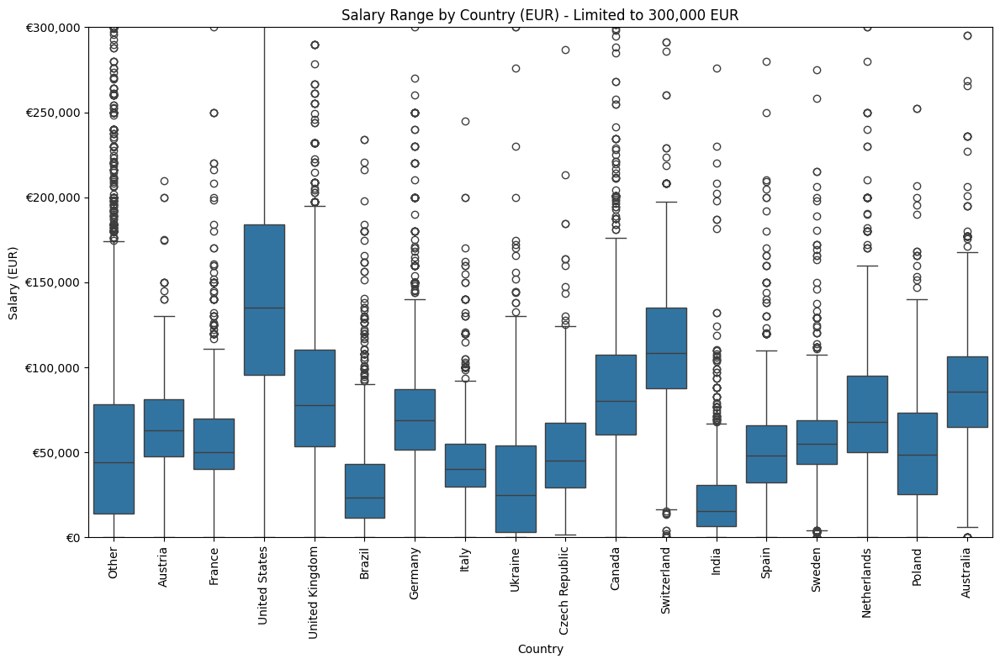

In [78]:
import matplotlib.ticker as mticker

# Set the figure size
plt.figure(figsize=(12, 8))

# Create a box plot for salary range vs country
sns.boxplot(x='country', y='salary_eur', data=df_24)

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Set the title and labels
plt.title('Salary Range by Country (EUR) - Limited to 300,000 EUR')
plt.xlabel('Country')
plt.ylabel('Salary (EUR)')

# Limit the y-axis to a maximum of 300,000 EUR
plt.ylim(0, 300000)

# Format the y-axis to show proper salary values
plt.gca().yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'€{x:,.0f}'))

# Show the plot
plt.tight_layout()
plt.show()

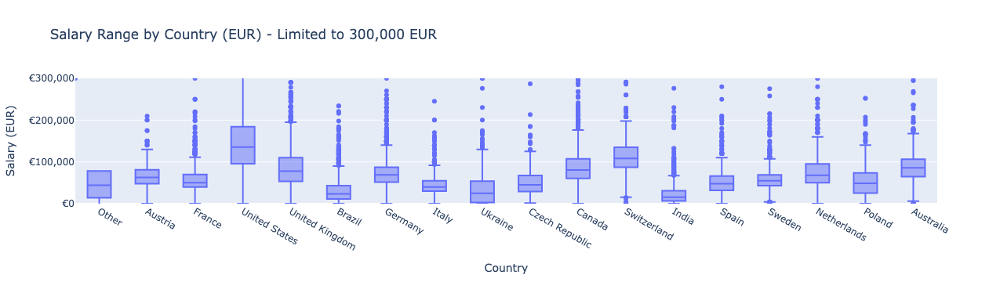

In [55]:
import plotly.express as px

# Create a box plot for salary range vs country
fig = px.box(df_24, x='country', y='salary_eur', 
             title='Salary Range by Country (EUR) - Limited to 300,000 EUR',
             labels={'salary_eur': 'Salary (EUR)', 'country': 'Country'})

# Limit the y-axis to a maximum of 300,000 EUR
fig.update_layout(yaxis=dict(range=[0, 300000]))

# Update y-axis formatting to include proper salary display
fig.update_yaxes(tickprefix='€', tickformat=',.0f')

# Display the plot
fig.show()

In [68]:
# check the salariy column and unusual high max values
# Filter the rows where salary_eur is greater than 300,000
high_salary_df = df_24[df_24['salary_eur'] > 300000][['country', 'currency', 'salary', 'salary_eur']]

# Display the filtered rows
display(high_salary_df, high_salary_df['country'].value_counts())

,country,currency,salary,salary_eur
63,United States,USD,6.500000e+05,5.980000e+05
71,United States,USD,4.000000e+05,3.680000e+05
99,United States,USD,4.320000e+05,3.974400e+05
119,Sweden,SEK,1.000000e+11,8.600000e+09
194,United States,USD,4.020000e+05,3.698400e+05
...,...,...,...,...
33382,Other,Other,4.000000e+08,8.000000e+06
33470,Other,Other,5.400000e+07,1.080000e+06
33547,Other,Other,9.000000e+07,1.800000e+06
33574,Other,Other,4.200000e+07,8.400000e+05


country
Other             382
United States     367
United Kingdom     23
Canada             19
Germany            13
Switzerland         8
India               7
Australia           7
Netherlands         6
Brazil              6
France              5
Ukraine             4
Sweden              2
Austria             2
Spain               1
Poland              1
Italy               1
Name: count, dtype: int64

In [69]:
# decided to drop rows where salary_eur exceed 300,000 and focus on where the real range lies
# Drop rows where salary_eur is greater than 300,000
df_24_cleaned = df_24[df_24['salary_eur'] <= 300000]

# Verify the number of rows after filtering
print(df_24_cleaned.shape)

# Display a sample of the cleaned data
print(df_24_cleaned[['country', 'currency', 'salary', 'salary_eur']].head())

(32769, 11)
         country currency     salary  salary_eur
0          Other      PKR  2040000.0      6528.0
1        Austria      EUR    28000.0     28000.0
2          Other      EUR    85000.0     85000.0
3         France      EUR    50000.0     50000.0
4  United States      USD   110000.0    101200.0


---

# EDA Analysis:

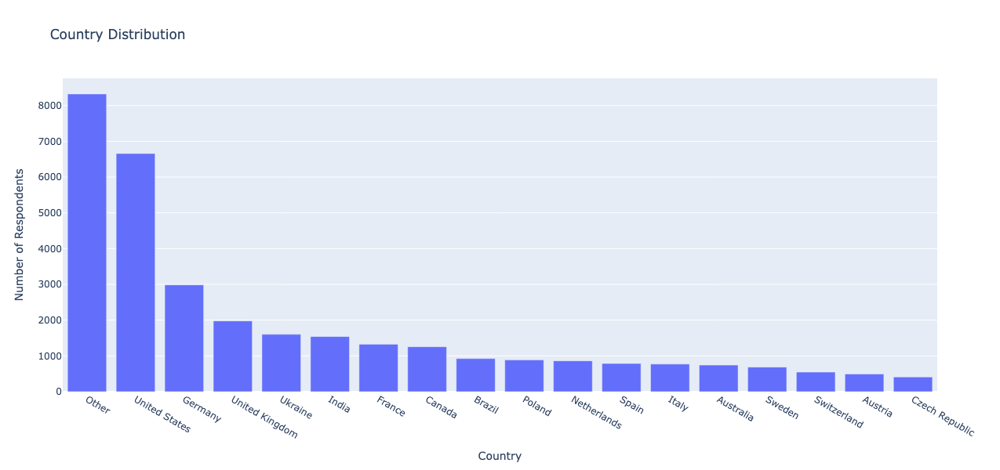

In [70]:
# Get the value counts for the 'country' column
country_distribution = df_24_cleaned['country'].value_counts().reset_index()
country_distribution.columns = ['country', 'count']

# Create a bar chart for country distribution
fig = px.bar(country_distribution, x='country', y='count', 
             title='Country Distribution',
             labels={'count': 'Number of Respondents', 'country': 'Country'},
             width=1000, height=600)

# Update layout for better visualization
fig.update_layout(xaxis={'categoryorder':'total descending'}, xaxis_title='Country', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

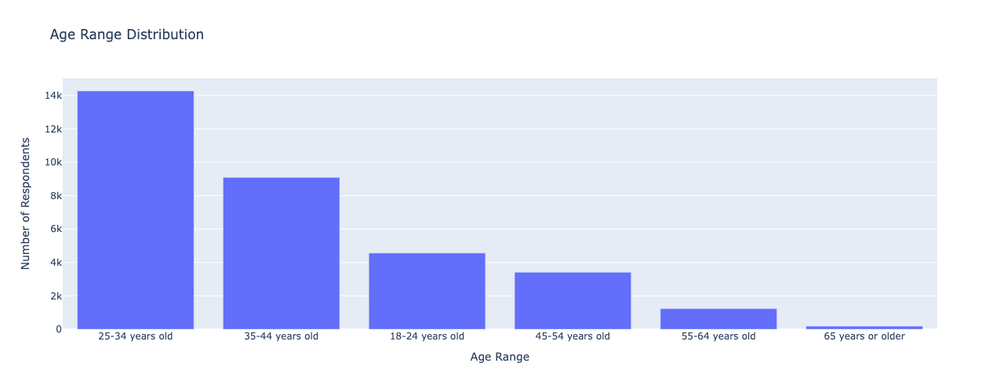

In [71]:
# Get the value counts for the 'age_range' column
age_range_distribution = df_24_cleaned['age_range'].value_counts().reset_index()
age_range_distribution.columns = ['age_range', 'count']

# Create a bar chart for age range distribution
fig = px.bar(age_range_distribution, x='age_range', y='count', 
             title='Age Range Distribution',
             labels={'count': 'Number of Respondents', 'age_range': 'Age Range'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Age Range', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

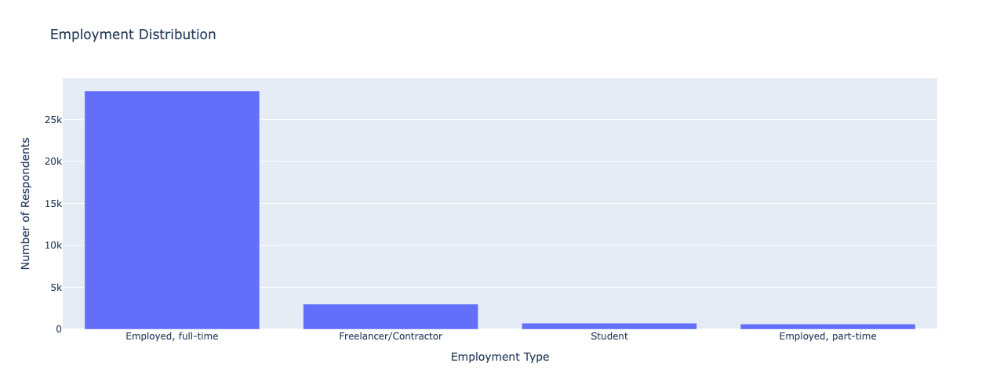

In [72]:
# Get the value counts for the 'employment' column
employment_distribution = df_24_cleaned['employment'].value_counts().reset_index()
employment_distribution.columns = ['employment', 'count']

# Create a bar chart for employment distribution
fig = px.bar(employment_distribution, x='employment', y='count', 
             title='Employment Distribution',
             labels={'count': 'Number of Respondents', 'employment': 'Employment Type'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Employment Type', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

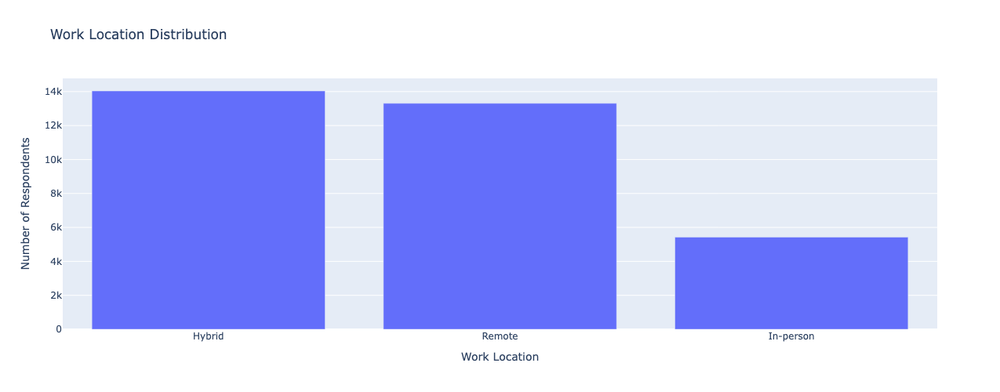

In [81]:
# Get the value counts for the 'work_location' column
work_location_distribution = df_24_cleaned['work_location'].value_counts().reset_index()
work_location_distribution.columns = ['work_location', 'count']

# Create a bar chart for work location distribution
fig = px.bar(work_location_distribution, x='work_location', y='count', 
             title='Work Location Distribution',
             labels={'count': 'Number of Respondents', 'work_location': 'Work Location'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Work Location', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

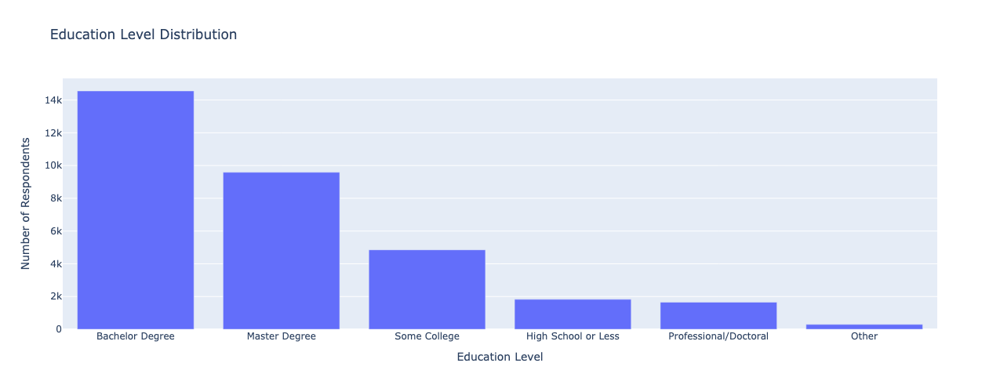

In [82]:
# Get the value counts for the 'education_level' column
education_level_distribution = df_24_cleaned['education_level'].value_counts().reset_index()
education_level_distribution.columns = ['education_level', 'count']

# Create a bar chart for education level distribution
fig = px.bar(education_level_distribution, x='education_level', y='count', 
             title='Education Level Distribution',
             labels={'count': 'Number of Respondents', 'education_level': 'Education Level'},
             width=800, height=500)

# Update layout for better visualization
fig.update_layout(xaxis_title='Education Level', yaxis_title='Number of Respondents')

# Display the plot
fig.show()

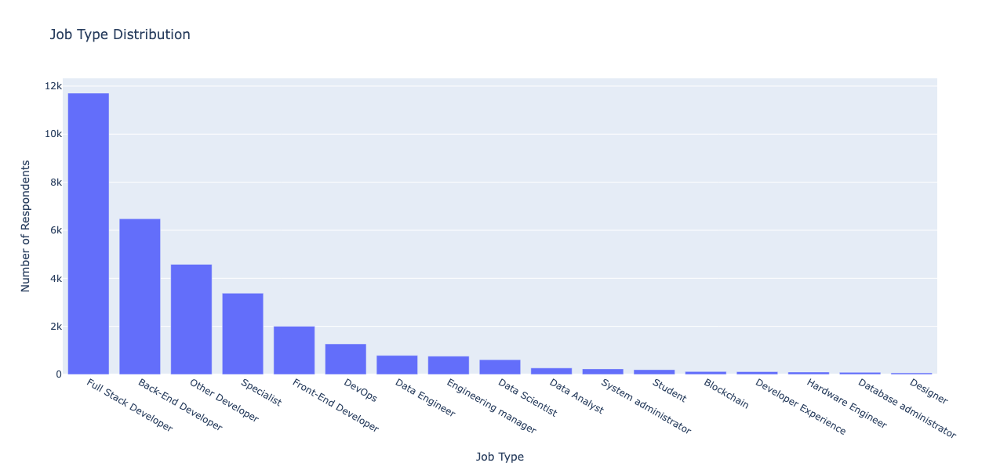

In [83]:
# Get the value counts for the 'type' column
type_distribution = df_24_cleaned['type'].value_counts().reset_index()
type_distribution.columns = ['type', 'count']

# Create a bar chart for type distribution
fig = px.bar(type_distribution, x='type', y='count', 
             title='Job Type Distribution',
             labels={'count': 'Number of Respondents', 'type': 'Job Type'},
             width=1000, height=600)

# Update layout for better visualization
fig.update_layout(xaxis_title='Job Type', yaxis_title='Number of Respondents', 
                  xaxis={'categoryorder':'total descending'})

# Display the plot
fig.show()

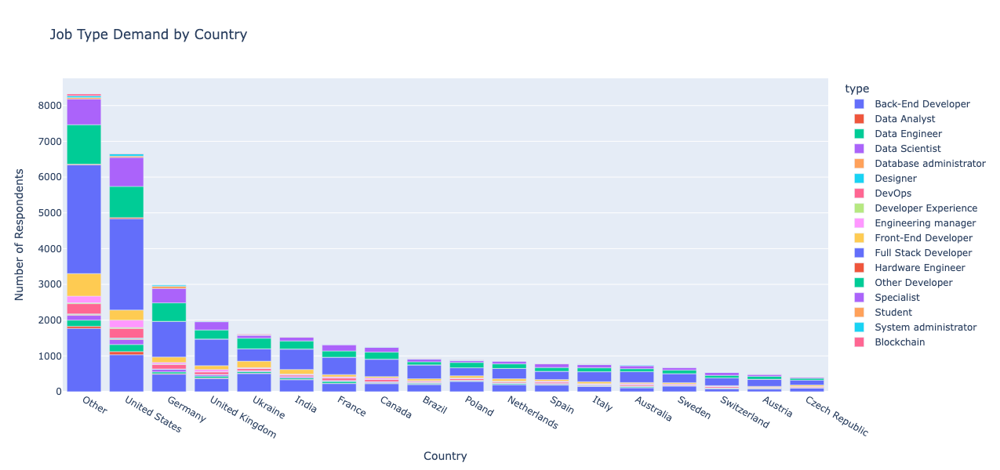

In [84]:
# Count of job types by country
job_type_country = df_24_cleaned.groupby(['country', 'type']).size().reset_index(name='count')

fig = px.bar(job_type_country, x='country', y='count', color='type', 
             title='Job Type Demand by Country',
             labels={'count': 'Number of Respondents', 'country': 'Country'},
             width=1000, height=600)

fig.update_layout(xaxis_title='Country', yaxis_title='Number of Respondents', xaxis={'categoryorder':'total descending'})
fig.show()

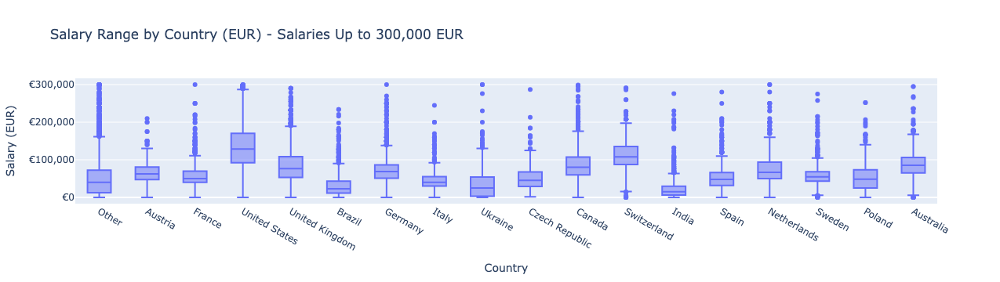

In [85]:
# Create a box plot for salary range vs country using the cleaned data
fig = px.box(df_24_cleaned, x='country', y='salary_eur', 
             title='Salary Range by Country (EUR) - Salaries Up to 300,000 EUR',
             labels={'salary_eur': 'Salary (EUR)', 'country': 'Country'})

# Update y-axis formatting to include proper salary display
fig.update_yaxes(tickprefix='€', tickformat=',.0f')

# Display the plot
fig.show()

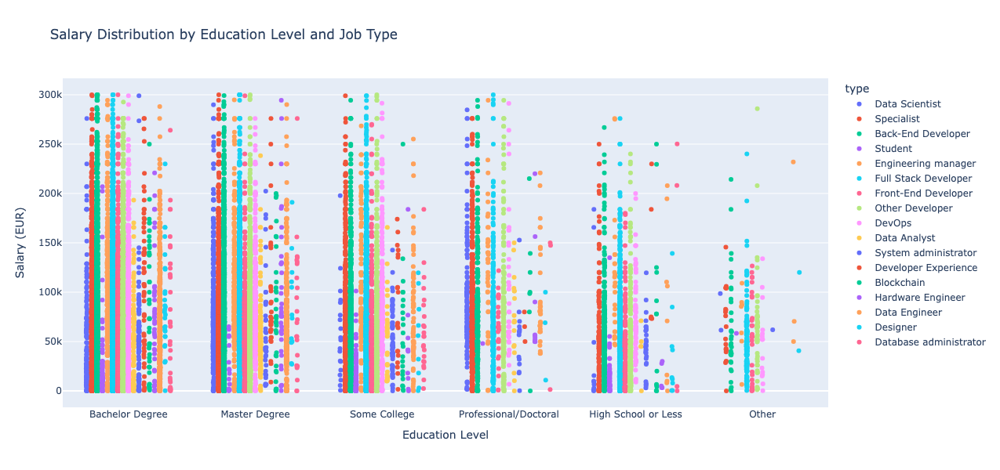

In [87]:
fig = px.strip(df_24_cleaned, x='education_level', y='salary_eur', color='type', 
               title='Salary Distribution by Education Level and Job Type',
               labels={'salary_eur': 'Salary (EUR)', 'education_level': 'Education Level'},
               hover_data=['type'],
               width=1000, height=600)

fig.update_layout(xaxis_title='Education Level', yaxis_title='Salary (EUR)', xaxis={'categoryorder':'total descending'})
fig.show()

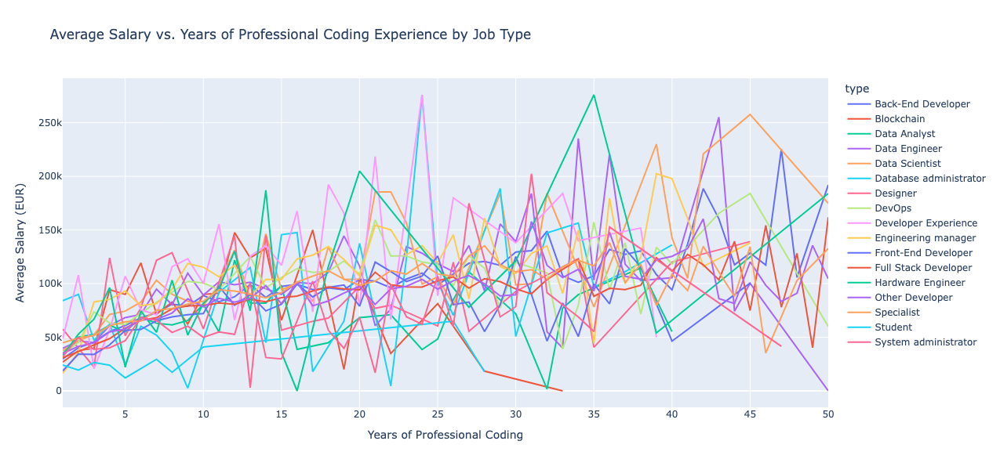

In [90]:
# Group by years of coding and job type to get average salary
salary_experience = df_24_cleaned.groupby(['years_coding_pro', 'type'])['salary_eur'].mean().reset_index()

fig = px.line(salary_experience, x='years_coding_pro', y='salary_eur', color='type', 
              title='Average Salary vs. Years of Professional Coding Experience by Job Type',
              labels={'salary_eur': 'Average Salary (EUR)', 'years_coding_pro': 'Years of Professional Coding'},
              width=1000, height=600)

fig.update_layout(xaxis_title='Years of Professional Coding', yaxis_title='Average Salary (EUR)')
fig.show()

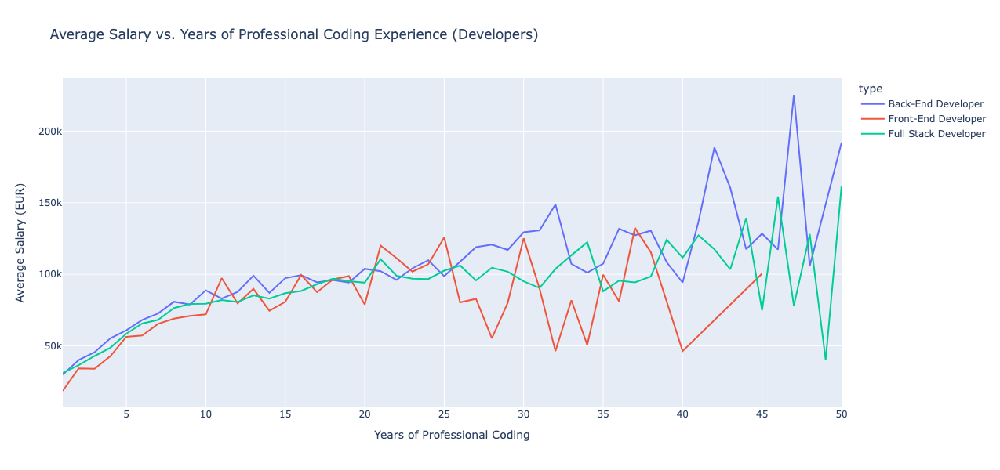

In [92]:
# Define the job types for developers
developer_types = ['Full Stack Developer', 'Back-End Developer', 'Front-End Developer']

# Filter the dataset for developers
developer_salary_experience = df_24_cleaned[df_24_cleaned['type'].isin(developer_types)]

# Group by years of coding and job type to get average salary for developers
developer_salary_experience = developer_salary_experience.groupby(['years_coding_pro', 'type'])['salary_eur'].mean().reset_index()

# Plot the graph for developers
fig = px.line(developer_salary_experience, x='years_coding_pro', y='salary_eur', color='type', 
              title='Average Salary vs. Years of Professional Coding Experience (Developers)',
              labels={'salary_eur': 'Average Salary (EUR)', 'years_coding_pro': 'Years of Professional Coding'},
              width=1000, height=600)

fig.update_layout(xaxis_title='Years of Professional Coding', yaxis_title='Average Salary (EUR)')
fig.show()

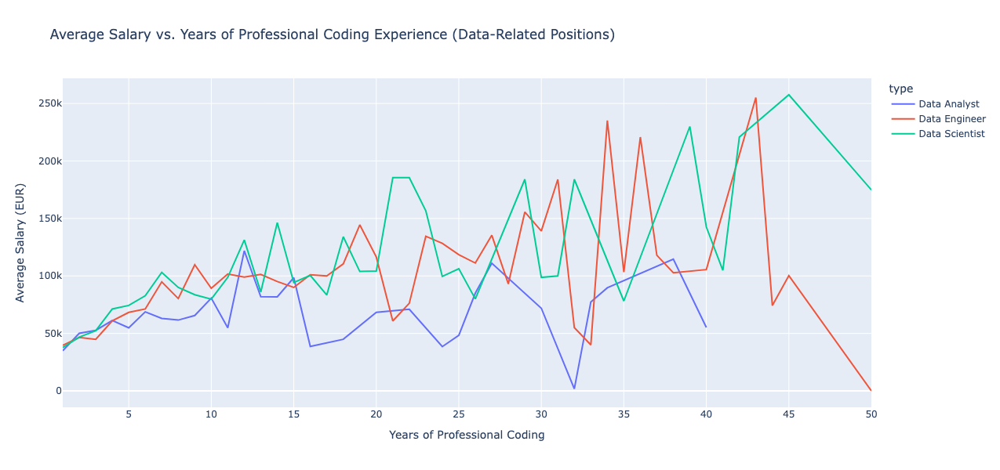

In [93]:
# Define the job types for data-related positions
data_related_types = ['Data Scientist', 'Data Engineer', 'Data Analyst', 'Machine Learning Specialist']

# Filter the dataset for data-related positions
data_salary_experience = df_24_cleaned[df_24_cleaned['type'].isin(data_related_types)]

# Group by years of coding and job type to get average salary for data-related positions
data_salary_experience = data_salary_experience.groupby(['years_coding_pro', 'type'])['salary_eur'].mean().reset_index()

# Plot the graph for data-related positions
fig = px.line(data_salary_experience, x='years_coding_pro', y='salary_eur', color='type', 
              title='Average Salary vs. Years of Professional Coding Experience (Data-Related Positions)',
              labels={'salary_eur': 'Average Salary (EUR)', 'years_coding_pro': 'Years of Professional Coding'},
              width=1000, height=600)

fig.update_layout(xaxis_title='Years of Professional Coding', yaxis_title='Average Salary (EUR)')
fig.show()

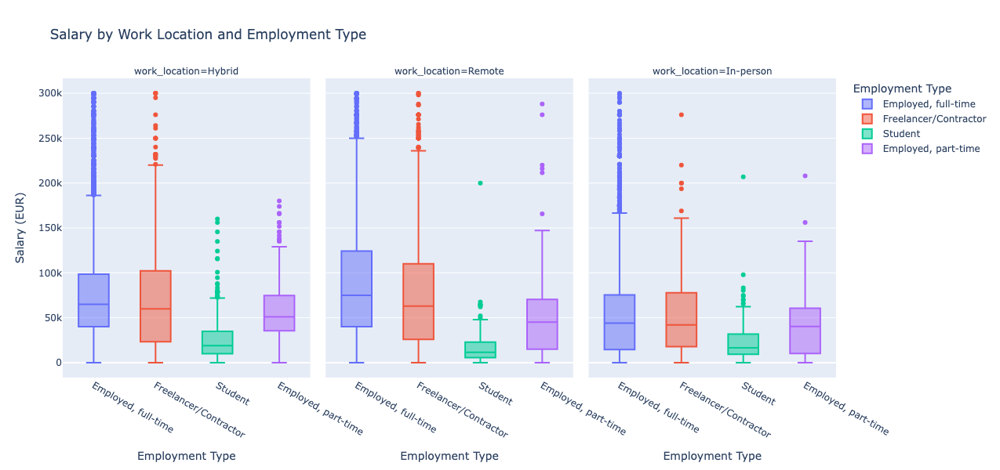

In [91]:
fig = px.box(df_24_cleaned, x='employment', y='salary_eur', color='employment',
             facet_col='work_location', title='Salary by Work Location and Employment Type',
             labels={'salary_eur': 'Salary (EUR)', 'employment': 'Employment Type'},
             width=1000, height=600)

fig.update_layout(xaxis_title='Employment Type', yaxis_title='Salary (EUR)')
fig.show()